# Butterfly Image Classification

# 1. Import libraries

In [26]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image
from collections import Counter

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

print(f"TensorFlow version: {tf.__version__}")
print(f"GPU Available: {len(tf.config.list_physical_devices('GPU'))} GPU(s)")

TensorFlow version: 2.21.0
GPU Available: 0 GPU(s)


# 2. Load Dataset

In [ ]:
Train_Df = pd.read_csv('Training_set.csv')
Test_Df = pd.read_csv('Testing_set.csv')

In [ ]:
Train_DIR = os.path.join("train")
Test_DIR  = os.path.join( "test")

In [ ]:
Train_Df['filepath'] = Train_DIR + "/" + Train_Df['filename']
Test_Df['filepath'] = Test_DIR + "/" + Test_Df['filename']

In [ ]:
print("Train samples is {}".format(len(Train_Df)))
print("Test samples is {}".format(len(Test_Df)))
print("Butterfly species is {}".format(len(Train_Df['label'].unique())))

Train samples is 6499
Test samples is 2786
Butterfly species is 75


In [ ]:
Train_Df.head()

,filename,label,filepath
0,Image_1.jpg,SOUTHERN DOGFACE,train/Image_1.jpg
1,Image_2.jpg,ADONIS,train/Image_2.jpg
2,Image_3.jpg,BROWN SIPROETA,train/Image_3.jpg
3,Image_4.jpg,MONARCH,train/Image_4.jpg
4,Image_5.jpg,GREEN CELLED CATTLEHEART,train/Image_5.jpg


In [ ]:
Test_Df.head()

,filename,filepath
0,Image_1.jpg,test/Image_1.jpg
1,Image_2.jpg,test/Image_2.jpg
2,Image_3.jpg,test/Image_3.jpg
3,Image_4.jpg,test/Image_4.jpg
4,Image_5.jpg,test/Image_5.jpg


# 2.Data visualization

C:\Users\Dabojit\AppData\Local\Temp\ipykernel_14008\601788781.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=label_counts, x='Species', y='Count', palette='Set2')


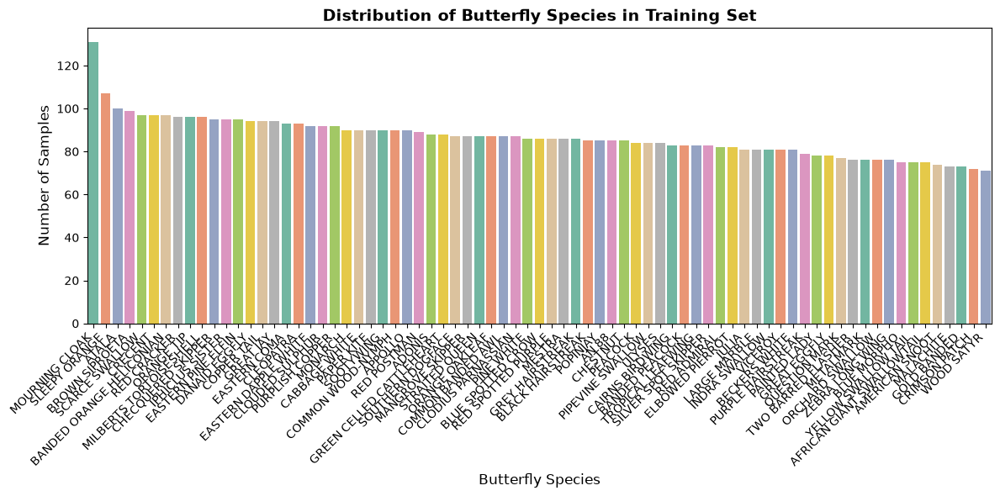

In [ ]:
# Visualize the distribution of butterfly species in training data
plt.figure(figsize=(12, 6))
label_counts = Train_Df['label'].value_counts().reset_index()
label_counts.columns = ['Species', 'Count']

sns.barplot(data=label_counts, x='Species', y='Count', palette='Set2')
plt.title('Distribution of Butterfly Species in Training Set', fontsize=14, fontweight='bold')
plt.xlabel('Butterfly Species', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

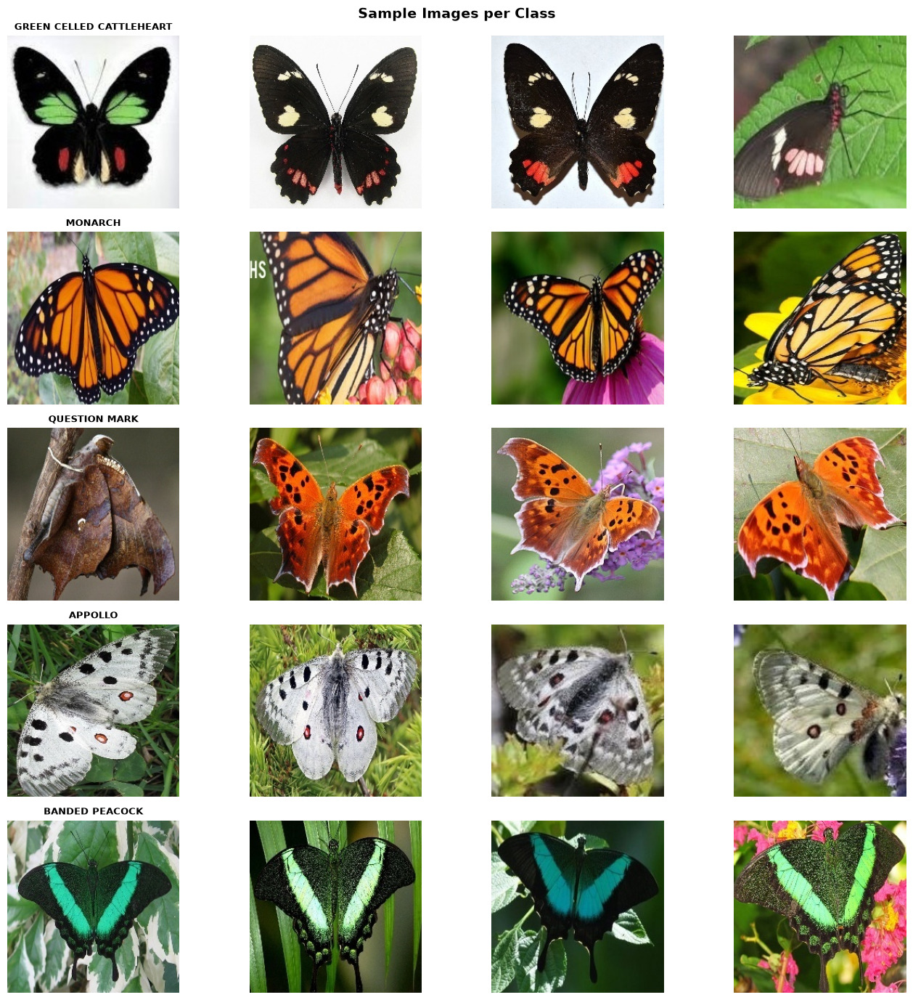

In [ ]:
SEED = 42

sample_classes = Train_Df['label'].sample(5, random_state=SEED).values

fig, axes = plt.subplots(5, 4, figsize=(14, 14))
for row, cls in enumerate(sample_classes):
    imgs = Train_Df[Train_Df['label'] == cls].sample(4, random_state=SEED)
    for col, (_, r) in enumerate(imgs.iterrows()):
        img = Image.open(r['filepath']).resize((224, 224))
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_title(cls, fontsize=9, fontweight='bold')
plt.suptitle('Sample Images per Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

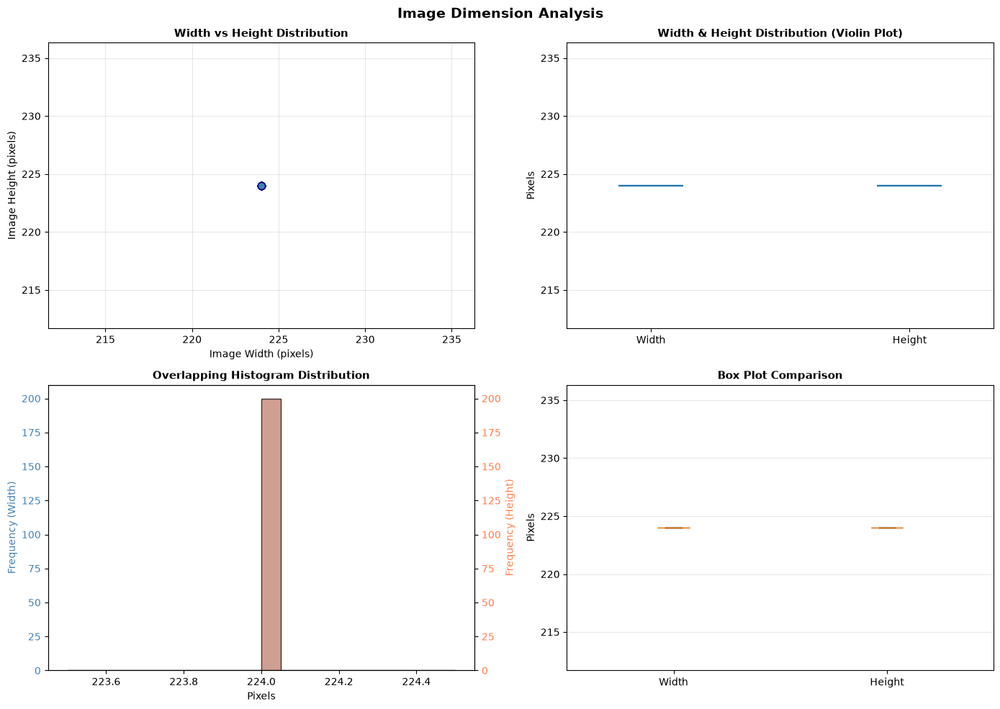

In [ ]:
##Analyze image dimensions with multiple visualization approaches
widths, heights = [], []
for fp in Train_Df['filepath'].sample(200, random_state=SEED):
    try:
        with Image.open(fp) as im:
            w, h = im.size
            widths.append(w)
            heights.append(h)
    except:
        pass

# Create a dataframe for easier plotting
img_dims_df = pd.DataFrame({'Width': widths, 'Height': heights})

# Create comprehensive visualizations
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Scatter plot - Width vs Height relationship
axes[0, 0].scatter(widths, heights, alpha=0.6, s=50, color='steelblue', edgecolor='navy')
axes[0, 0].set_xlabel('Image Width (pixels)', fontsize=10)
axes[0, 0].set_ylabel('Image Height (pixels)', fontsize=10)
axes[0, 0].set_title('Width vs Height Distribution', fontsize=11, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)

# 2. Violin plot - Distribution comparison
parts = axes[0, 1].violinplot([widths, heights], positions=[1, 2], showmeans=True, showmedians=True)
axes[0, 1].set_xticks([1, 2])
axes[0, 1].set_xticklabels(['Width', 'Height'])
axes[0, 1].set_ylabel('Pixels', fontsize=10)
axes[0, 1].set_title('Width & Height Distribution (Violin Plot)', fontsize=11, fontweight='bold')
axes[0, 1].grid(True, alpha=0.3, axis='y')

# 3. KDE plot using seaborn
axes[1, 0].hist(widths, bins=20, alpha=0.5, label='Width', color='steelblue', edgecolor='black')
ax_twin = axes[1, 0].twinx()
ax_twin.hist(heights, bins=20, alpha=0.5, label='Height', color='coral', edgecolor='black')
axes[1, 0].set_xlabel('Pixels', fontsize=10)
axes[1, 0].set_ylabel('Frequency (Width)', fontsize=10, color='steelblue')
ax_twin.set_ylabel('Frequency (Height)', fontsize=10, color='coral')
axes[1, 0].set_title('Overlapping Histogram Distribution', fontsize=11, fontweight='bold')
axes[1, 0].tick_params(axis='y', labelcolor='steelblue')
ax_twin.tick_params(axis='y', labelcolor='coral')

# 4. Box plot comparison
bp = axes[1, 1].boxplot([widths, heights], patch_artist=True)
for patch, color in zip(bp['boxes'], ['steelblue', 'coral']):
    patch.set_facecolor(color)
    patch.set_alpha(0.6)
axes[1, 1].set_xticklabels(['Width', 'Height'])
axes[1, 1].set_ylabel('Pixels', fontsize=10)
axes[1, 1].set_title('Box Plot Comparison', fontsize=11, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3, axis='y')

plt.suptitle('Image Dimension Analysis', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Preprocess the Model

In [ ]:
from sklearn.model_selection import train_test_split

SEED = 42
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 5
FINE_TUNE_EPOCHS = 3

train_df = Train_Df.copy()
test_df = Test_Df.copy()
train_df['label_str'] = train_df['label'].astype(str)
class_names = sorted(train_df['label_str'].unique())

train_split, val_split = train_test_split(
    train_df,
    test_size=0.2,
    random_state=SEED,
    stratify=train_df['label_str']
)

print(f"Train samples: {len(train_split)}")
print(f"Validation samples: {len(val_split)}")
print(f"Classes: {len(class_names)}")

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=20,
    width_shift_range=0.15,
    height_shift_range=0.15,
    shear_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_dataframe(
    train_split,
    x_col='filepath',
    y_col='label_str',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

val_generator = val_datagen.flow_from_dataframe(
    val_split,
    x_col='filepath',
    y_col='label_str',
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='filepath',
    y_col=None,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    shuffle=False
)

num_classes = len(class_names)

base_model = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=(*IMG_SIZE, 3),
    pooling='avg'
)
base_model.trainable = False

inputs = keras.Input(shape=(*IMG_SIZE, 3))
x = base_model(inputs, training=False)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)
model = keras.Model(inputs, outputs)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

callbacks = [
    EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=1, min_lr=1e-6),
    ModelCheckpoint('butterfly_best_model.keras', monitor='val_accuracy', save_best_only=True)
]

print('Preprocessing and model setup completed.')

Train samples: 5199
Validation samples: 1300
Classes: 75
Found 5199 validated image filenames belonging to 75 classes.
Found 1300 validated image filenames belonging to 75 classes.
Found 2786 validated image filenames.
Preprocessing and model setup completed.


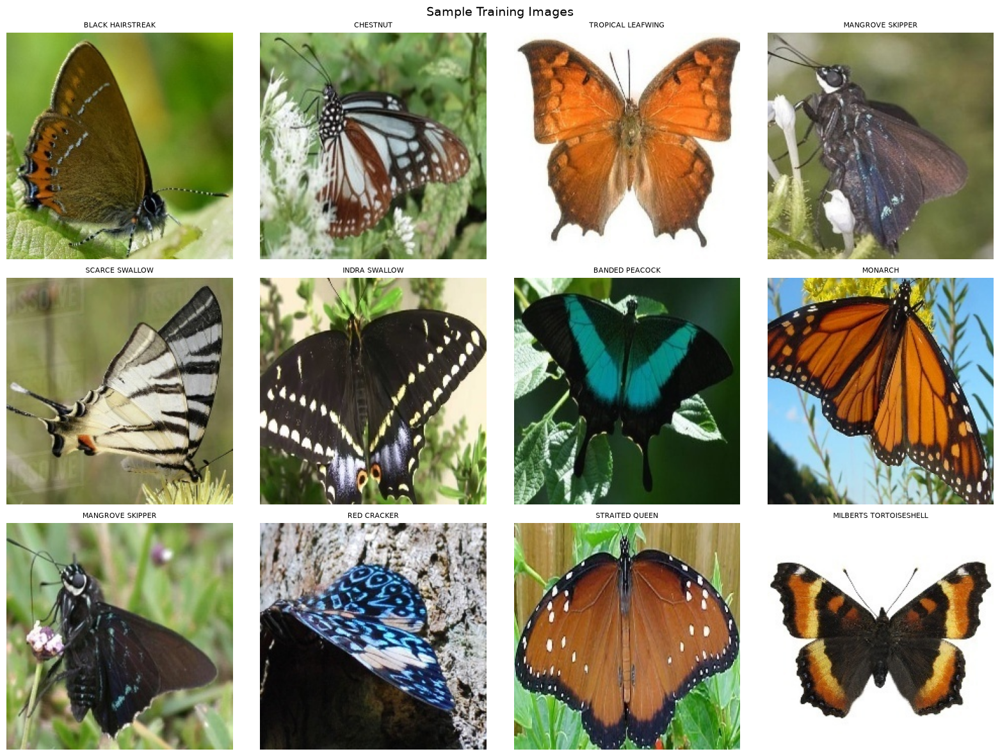

In [ ]:
sample_rows = train_split.sample(12, random_state=SEED)
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

for ax, (_, row) in zip(axes.flat, sample_rows.iterrows()):
    img = Image.open(row['filepath']).convert('RGB').resize(IMG_SIZE)
    ax.imshow(img)
    ax.set_title(row['label'], fontsize=8)
    ax.axis('off')

plt.suptitle('Sample Training Images', fontsize=14)
plt.tight_layout()
plt.show()

# Build the Model

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=5, name='top5_acc')]
)

callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=1e-7, verbose=1),
    ModelCheckpoint(
        'best_butterfly_model.keras',
        monitor='val_accuracy',
        save_best_only=True,
        verbose=1
    )
]

print('Phase 1: Training classification head (backbone frozen)')

Phase 1: Training classification head (backbone frozen)


# Train the model

In [14]:
history1 = model.fit(
    train_generator,
    epochs=15,
    validation_data=val_generator,
    callbacks=callbacks,
    steps_per_epoch=len(train_generator),
    validation_steps=len(val_generator)
)
print("\nPhase 1 complete!")

Epoch 1/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.0160 - loss: 4.5784 - top5_acc: 0.0764
Epoch 1: val_accuracy improved from None to 0.01308, saving model to best_butterfly_model.keras

Epoch 1: finished saving model to best_butterfly_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 279s 2s/step - accuracy: 0.0160 - loss: 4.5784 - top5_acc: 0.0764 - val_accuracy: 0.0131 - val_loss: 4.3138 - val_top5_acc: 0.0731 - learning_rate: 0.0010
Epoch 2/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.0206 - loss: 4.5464 - top5_acc: 0.0871
Epoch 2: val_accuracy improved from 0.01308 to 0.02077, saving model to best_butterfly_model.keras

Epoch 2: finished saving model to best_butterfly_model.keras
163/163 ━━━━━━━━━━━━━━━━━━━━ 199s 1s/step - accuracy: 0.0206 - loss: 4.5464 - top5_acc: 0.0871 - val_accuracy: 0.0208 - val_loss: 4.2894 - val_top5_acc: 0.1208 - learning_rate: 0.0010
Epoch 3/15
163/163 ━━━━━━━━━━━━━━━━━━━━ 0s 819ms/step - accuracy: 0.0202 - loss: 4.5170 - top5_acc: 0.096

In [15]:

base_model.trainable = True
fine_tune_at = 150

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=5, name='top5_acc')]
)

print(f"Fine-tuning from layer {fine_tune_at} onwards")
print(f"Trainable layers: {sum(1 for l in model.layers if l.trainable)}")

history1_obj = globals().get('history1', None)
if history1_obj is not None:
    initial_epoch = len(history1_obj.history['loss'])
    print(f"Continuing from epoch {initial_epoch}")
else:
    initial_epoch = 0
    print("Phase 1 history was not found; starting fine-tuning from epoch 0.")

history2 = model.fit(
    train_generator,
    epochs=1,
    initial_epoch=initial_epoch,
    validation_data=val_generator,
    callbacks=callbacks,
    steps_per_epoch=25,
    validation_steps=10
)
print("\nPhase 2 (Fine-tuning) complete!")

Fine-tuning from layer 150 onwards
Trainable layers: 5
Continuing from epoch 15

Phase 2 (Fine-tuning) complete!


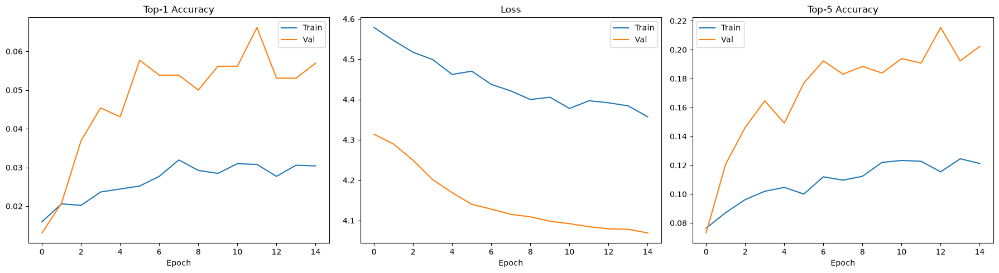

In [16]:
def merge_history(h1, h2):
    if h1 is None and h2 is None:
        return {}
    if h1 is None:
        return h2.history
    if h2 is None:
        return h1.history

    merged = {}
    for k in h1.history:
        if k in h2.history:
            merged[k] = h1.history[k] + h2.history[k]
        else:
            merged[k] = h1.history[k]
    return merged

hist = merge_history(
    globals().get("history1", None),
    globals().get("history2", None)
)

if not hist:
    raise RuntimeError("No training history found. Run the training cells first.")

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(hist['accuracy'],     label='Train')
axes[0].plot(hist['val_accuracy'], label='Val')
axes[0].set_title('Top-1 Accuracy')
axes[0].legend(); axes[0].set_xlabel('Epoch')

axes[1].plot(hist['loss'],     label='Train')
axes[1].plot(hist['val_loss'], label='Val')
axes[1].set_title('Loss')
axes[1].legend(); axes[1].set_xlabel('Epoch')

axes[2].plot(hist['top5_acc'],     label='Train')
axes[2].plot(hist['val_top5_acc'], label='Val')
axes[2].set_title('Top-5 Accuracy')
axes[2].legend(); axes[2].set_xlabel('Epoch')

plt.tight_layout()
plt.savefig('training_curves.png', dpi=150)
plt.show()

# Save the model

In [17]:
model.save("butterfly_model.h5")
print("Model saved successfully")

Model saved successfully


# Evaluate The Model

In [19]:
best_model = keras.models.load_model('best_butterfly_model.keras')
val_loss, val_acc, val_top5 = best_model.evaluate(val_generator, verbose=1) 
print(f"\nValidation Loss of the model is {val_loss:.4f}")
print(f" Validation Accuracy of the model is {val_acc*100:.2f}%")
print(f" Top-5 Accuracy of the model is {val_top5*100:.2f}%")

41/41 ━━━━━━━━━━━━━━━━━━━━ 34s 641ms/step - accuracy: 0.0662 - loss: 4.0844 - top5_acc: 0.1908

Validation Loss of the model is 4.0844
 Validation Accuracy of the model is 6.62%
 Top-5 Accuracy of the model is 19.08%


In [20]:
val_generator.reset()
y_pred_probs = best_model.predict(val_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)
class_indices = train_generator.class_indices          
idx_to_cls    = {v: k for k, v in class_indices.items()}
y_true = val_generator.classes

target_names = [idx_to_cls[i] for i in range(num_classes)]
print(classification_report(y_true, y_pred, target_names=target_names))

41/41 ━━━━━━━━━━━━━━━━━━━━ 37s 852ms/step
                           precision    recall  f1-score   support

                   ADONIS       0.00      0.00      0.00        18
AFRICAN GIANT SWALLOWTAIL       0.00      0.00      0.00        15
           AMERICAN SNOOT       0.00      0.00      0.00        15
                    AN 88       0.26      0.47      0.33        17
                  APPOLLO       0.00      0.00      0.00        18
                    ATALA       0.10      0.20      0.14        20
 BANDED ORANGE HELICONIAN       0.00      0.00      0.00        20
           BANDED PEACOCK       0.00      0.00      0.00        17
            BECKERS WHITE       0.00      0.00      0.00        16
         BLACK HAIRSTREAK       0.00      0.00      0.00        17
              BLUE MORPHO       0.00      0.00      0.00        15
        BLUE SPOTTED CROW       0.00      0.00      0.00        17
           BROWN SIPROETA       0.00      0.00      0.00        20
            CABBAGE

c:\Users\Dabojit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Dabojit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Dabojit\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1879: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_p

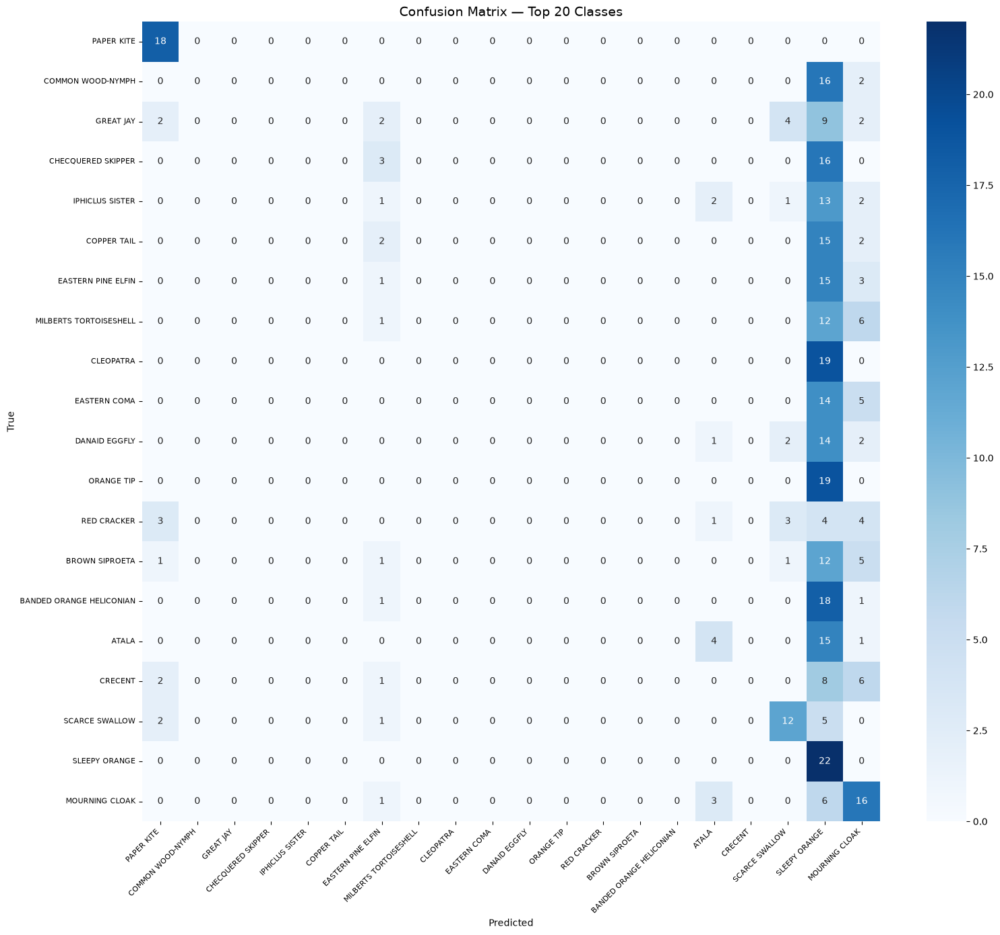

In [21]:
cm = confusion_matrix(y_true, y_pred)
top_n = 20
top_classes_idx = np.argsort(cm.sum(axis=1))[-top_n:]
cm_top = cm[np.ix_(top_classes_idx, top_classes_idx)]
top_names = [idx_to_cls[i] for i in top_classes_idx]

plt.figure(figsize=(16, 14))
sns.heatmap(
    cm_top, annot=True, fmt='d', cmap='Blues',
    xticklabels=top_names, yticklabels=top_names
)
plt.title(f'Confusion Matrix — Top {top_n} Classes', fontsize=14)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150)
plt.show()

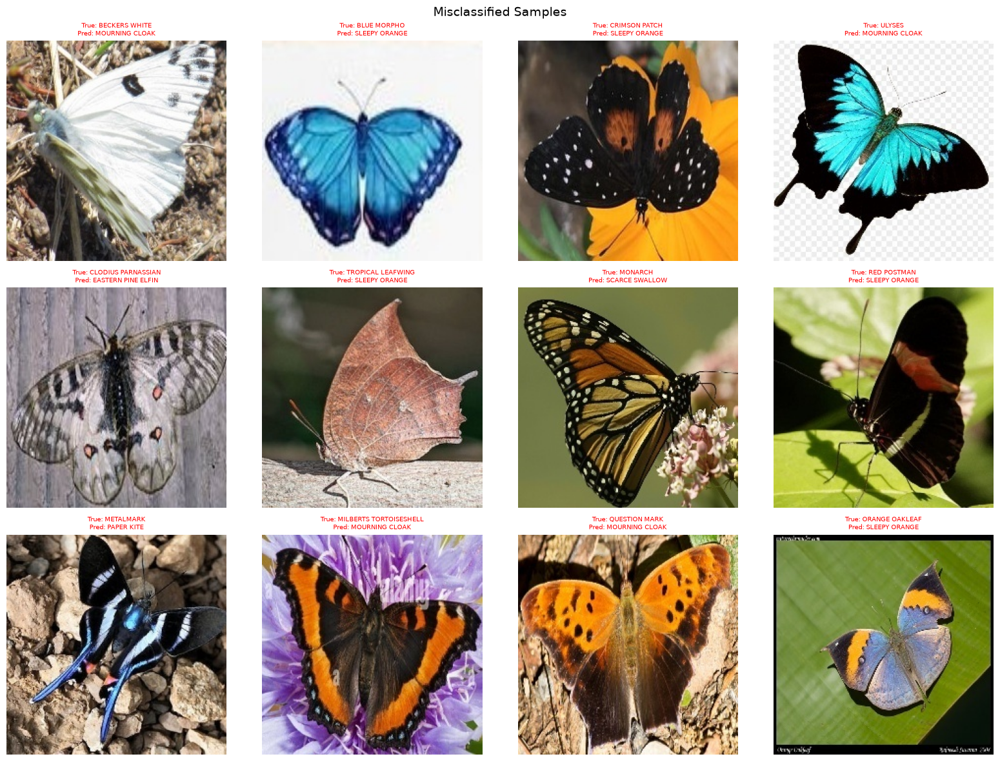

In [22]:
wrong_idx = np.where(y_pred != y_true)[0][:12]
val_files  = val_split['filepath'].values

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
for ax, i in zip(axes.flat, wrong_idx):
    img = Image.open(val_files[i]).resize((224, 224))
    ax.imshow(img)
    ax.set_title(
        f"True: {idx_to_cls[y_true[i]]}\nPred: {idx_to_cls[y_pred[i]]}",
        fontsize=7, color='red'
    )
    ax.axis('off')
plt.suptitle('Misclassified Samples', fontsize=14)
plt.tight_layout()
plt.show()

# Predict on a single image

Predicting on: test/Image_1.jpg


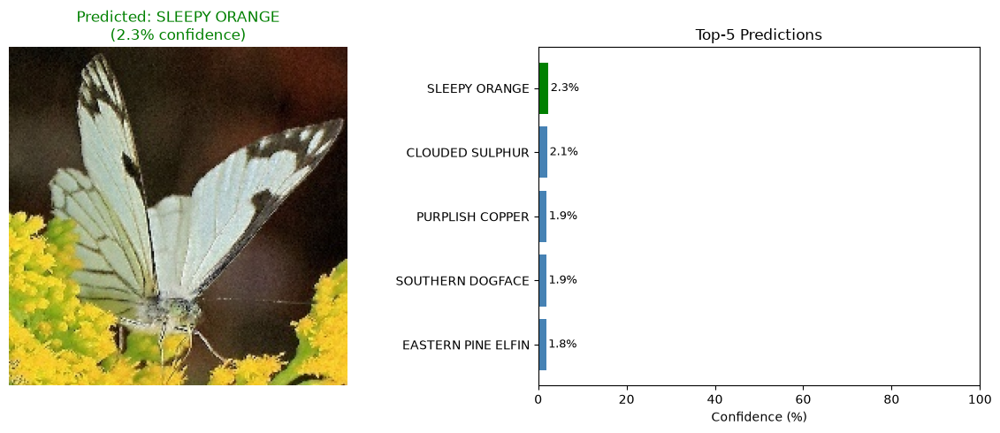


 Predicted Species: SLEEPY ORANGE
   Confidence       : 2.31%


In [23]:
def predict_single_image(image_path, model, idx_to_cls, img_size=(224, 224), top_k=5):
    
    img = Image.open(image_path).convert('RGB').resize(img_size)
    img_array = np.array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)   # (1, 224, 224, 3)

    preds = model.predict(img_array, verbose=0)[0]
    top_k_idx  = np.argsort(preds)[::-1][:top_k]
    top_k_conf = preds[top_k_idx]
    top_k_cls  = [idx_to_cls[i] for i in top_k_idx]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    axes[0].imshow(img)
    axes[0].set_title(f"Predicted: {top_k_cls[0]}\n({top_k_conf[0]*100:.1f}% confidence)",
                      fontsize=12, color='green')
    axes[0].axis('off')

    colors = ['green'] + ['steelblue'] * (top_k - 1)
    axes[1].barh(top_k_cls[::-1], top_k_conf[::-1] * 100, color=colors[::-1])
    axes[1].set_xlabel('Confidence (%)')
    axes[1].set_title(f'Top-{top_k} Predictions')
    axes[1].set_xlim(0, 100)
    for j, (v, c) in enumerate(zip(top_k_conf[::-1], top_k_cls[::-1])):
        axes[1].text(v * 100 + 0.5, j, f'{v*100:.1f}%', va='center', fontsize=9)

    plt.tight_layout()
    plt.show()

    print(f"\n Predicted Species: {top_k_cls[0]}")
    print(f"   Confidence       : {top_k_conf[0]*100:.2f}%")
    return top_k_cls[0], top_k_conf[0]

SAMPLE_IMAGE = test_df['filepath'].iloc[0]
print(f"Predicting on: {SAMPLE_IMAGE}")

predicted_class, confidence = predict_single_image(
    SAMPLE_IMAGE, best_model, idx_to_cls, top_k=5
)

In [25]:
test_generator.reset()
test_preds_probs = best_model.predict(test_generator, verbose=1)
test_preds_idx   = np.argmax(test_preds_probs, axis=1)
test_preds_cls   = [idx_to_cls[i] for i in test_preds_idx]

submission = pd.DataFrame({
    'filename': test_df['filename'],
    'label'   : test_preds_cls
})
submission.to_csv('submission.csv', index=False)
print("Saved: submission.csv")
submission.head(10)

88/88 ━━━━━━━━━━━━━━━━━━━━ 64s 682ms/step
Saved: submission.csv


,filename,label
0,Image_1.jpg,SLEEPY ORANGE
1,Image_2.jpg,ATALA
2,Image_3.jpg,MOURNING CLOAK
3,Image_4.jpg,MOURNING CLOAK
4,Image_5.jpg,MOURNING CLOAK
5,Image_6.jpg,SLEEPY ORANGE
6,Image_7.jpg,PAPER KITE
7,Image_8.jpg,MOURNING CLOAK
8,Image_9.jpg,MOURNING CLOAK
9,Image_10.jpg,PAPER KITE
